In [1]:
import random
import numpy as np
import pandas as pd
from numpy.linalg import norm
from collections import Counter

from sklearn.preprocessing import MinMaxScaler
from scipy.stats import rankdata
import scipy.stats as ss

from gensim.models.doc2vec import Doc2Vec
from mofgraph2vec.featurize.mof2doc import MOF2doc

from sklearn.manifold import TSNE
import umap
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
from adjustText import adjust_text
import matplotlib.lines as mlines
mpl.rcParams["font.size"] = 18

/Users/xiaoqi/opt/miniconda3/envs/mofgraph2vec/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/xiaoqi/opt/miniconda3/envs/mofgraph2vec/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/xiaoqi/opt/miniconda3/envs/mofgraph2vec/l

In [2]:
def cosine(A, B):
    return np.dot(A,B)/(norm(A)*norm(B))

In [3]:
CORPUS_CONFIG = {
  "embed_label": True,
  "label_path": "../data/arc-core-xq.csv",
  "descriptors_to_embed": ["Di", "Df", "Dif", "info.density"],
  "category_to_embed": ["Crystalnet"],
  "tags_to_embed": [], 
  "id_column": "info.name",
  "wl_step": 3,
  "n_components": 2,
  "use_hash": False,
  "writing_style": "paragraph",
  "composition": False,
  "mode": "all",
  "embed_cif": False
}

In [4]:
ARC_MODEL_PATH = "../experiments/workflow/wandb/offline-run-20240402_114405-9m7v9c42/tmp/embedding_model.pt"

In [5]:
ARC_CIF = ["../data/cifs/arc/"]

In [6]:
ARC_ID = "info.name"

In [7]:
def load_vector(test_cif_path, model):
    corpus = {}
    documents = {}
    test_ds = MOF2doc(cif_path=test_cif_path, **CORPUS_CONFIG).get_documents()
    for dp in test_ds:
        documents.update(
            {dp.tags[0]: dp.words}
        )
        corpus.update(
            {dp.tags[0]: model.dv[dp.tags[0]]}
        )
    return documents, corpus

In [8]:
arc_model = Doc2Vec.load(ARC_MODEL_PATH)

In [9]:
df = pd.read_csv("../data/arc-core-xq-1120.csv")

/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_43170/2602359553.py:1: DtypeWarning: Columns (22,25,106,107,108,109) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("../data/arc-core-xq-1120.csv")


In [10]:
def topn(mofs, targets, ntop):
    combined_lists = list(zip(mofs, targets))
    sorted_combined_lists = sorted(combined_lists, key=lambda x: x[1], reverse=True)
    top = [item[0] for item in sorted_combined_lists[:ntop]]
    return top

# Projection

In [11]:
all_mofs = arc_model.dv.index_to_key
all_emb = np.array([arc_model.dv[x] for x in all_mofs])

In [12]:
projector = TSNE(n_components=2, perplexity=30)
emb_2d = projector.fit_transform(all_emb)

In [13]:
len(all_mofs), emb_2d.shape

(22035, (22035, 2))

# Global functions

In [14]:
def target_mapping(data, id_name, targets, mofs):
    values = []
    for tar in targets:
        val = np.array([data[data[id_name] == m][tar].values[0] for m in mofs])
        values.append(val)
    return values

In [15]:
def batch_recommendation(model, tops, data, id_name, targets, no_top):
    ratio = 1.0
    while True:
        no_recm = int(no_top / (len(tops) * ratio))
        print("Current ratio:", ratio)
        recommendations = []
        cosines = []
        i = 0
        while len(recommendations) < no_top and i < len(tops):
            t = tops[i]
            recm = model.dv.most_similar(t, topn=no_recm)
            recm_names = [x[0] for x in recm]
            recommendations += recm_names
            recommendations = np.unique(recommendations).tolist()
            for r in recommendations:
                vec_t = model.dv[t]
                vec_r = model.dv[r]
                cos = cosine(vec_t, vec_r)
                cosines.append(cos)
            i += 1
        
        if len(recommendations) >= no_top:
            break
        else:
            ratio *= 0.9  # You can adjust the multiplier based on your specific scenario
    
    recommendations = recommendations[:no_top]
    cosines = cosines[:no_top]
    
    target_values = target_mapping(data, id_name, targets, recommendations)
    assert len(recommendations) == no_top
    return recommendations, target_values, cosines

In [16]:
def top_rank(mofs, targets, ntop):
    ranks = [rankdata(tar) for tar in targets]
    sum_ranks = np.sum(np.array(ranks), axis=0)
    combined_lists = list(zip(mofs, sum_ranks))
    sorted_combined_lists = sorted(combined_lists, key=lambda x: x[1], reverse=True)
    top = [item[0] for item in sorted_combined_lists[:ntop]]
    return top

# Section 1. Recommendation for similar structures

## Case 1. Methane storage

### Target2. Multiple targets

In [17]:
CH4_TARGETS = ["xq.ch4_logkh", "xq.ch4_wc"]

In [18]:
N = 1000
N_top = int(N/50)

#### 1. Initialization

In [19]:
random.seed(2023)
ch4_mof1 = random.choices(arc_model.dv.index_to_key, k=N)
[kh1, ch4_wc1] = target_mapping(df, ARC_ID, CH4_TARGETS, ch4_mof1)

In [20]:
explored_ch4_mofs = ch4_mof1
[explored_ch4_kh, explored_ch4_wc] = target_mapping(df, ARC_ID, CH4_TARGETS, explored_ch4_mofs)

In [21]:
ch4_top1 = top_rank(explored_ch4_mofs, [explored_ch4_kh, explored_ch4_wc], N_top)

#### 2. 1st round

In [22]:
ch4_mof2, [kh2, ch4_wc2], ch4_cos1 = batch_recommendation(arc_model, ch4_top1, df, ARC_ID, CH4_TARGETS, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81


In [23]:
explored_ch4_mofs = np.unique(np.concatenate((ch4_mof1, ch4_mof2)))
[explored_ch4_kh, explored_ch4_wc] = target_mapping(df, ARC_ID, CH4_TARGETS, explored_ch4_mofs)

In [24]:
ch4_top2 = top_rank(explored_ch4_mofs,[explored_ch4_kh, explored_ch4_wc], N_top)

#### 3. 2nd round

In [25]:
ch4_mof3, [kh3, ch4_wc3], ch4_cos2 = batch_recommendation(arc_model, ch4_top2, df, ARC_ID, CH4_TARGETS, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81
Current ratio: 0.7290000000000001
Current ratio: 0.6561000000000001
Current ratio: 0.5904900000000002


In [26]:
explored_ch4_mofs = np.unique(np.concatenate((ch4_mof1, ch4_mof2, ch4_mof3)))
[explored_ch4_kh, explored_ch4_wc] = target_mapping(df, ARC_ID, CH4_TARGETS, explored_ch4_mofs)

In [27]:
ch4_top3 = top_rank(explored_ch4_mofs, [explored_ch4_kh, explored_ch4_wc], N_top)

#### 4. 3rd round

In [28]:
ch4_mof4, [kh4, ch4_wc4], ch4_cos3 = batch_recommendation(arc_model, ch4_top3, df, ARC_ID, CH4_TARGETS, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81
Current ratio: 0.7290000000000001
Current ratio: 0.6561000000000001
Current ratio: 0.5904900000000002
Current ratio: 0.5314410000000002


In [29]:
explored_ch4_mofs = np.unique(np.concatenate((ch4_mof1, ch4_mof2, ch4_mof3, ch4_mof4)))
[explored_ch4_kh, explored_ch4_wc] = target_mapping(df, ARC_ID, CH4_TARGETS, explored_ch4_mofs)

In [30]:
ch4_top4 = top_rank(explored_ch4_mofs,[explored_ch4_kh, explored_ch4_wc], N_top)

#### 5. 4th round

In [31]:
ch4_mof5, [kh5, ch4_wc5], ch4_cos5 = batch_recommendation(arc_model, ch4_top4, df, ARC_ID, CH4_TARGETS, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81
Current ratio: 0.7290000000000001
Current ratio: 0.6561000000000001
Current ratio: 0.5904900000000002


In [32]:
explored_ch4_mofs = np.unique(np.concatenate((ch4_mof1, ch4_mof2, ch4_mof3, ch4_mof4, ch4_mof5)))
[explored_ch4_kh, explored_ch4_wc] = target_mapping(df, ARC_ID, CH4_TARGETS, explored_ch4_mofs)

#### 6. Plot

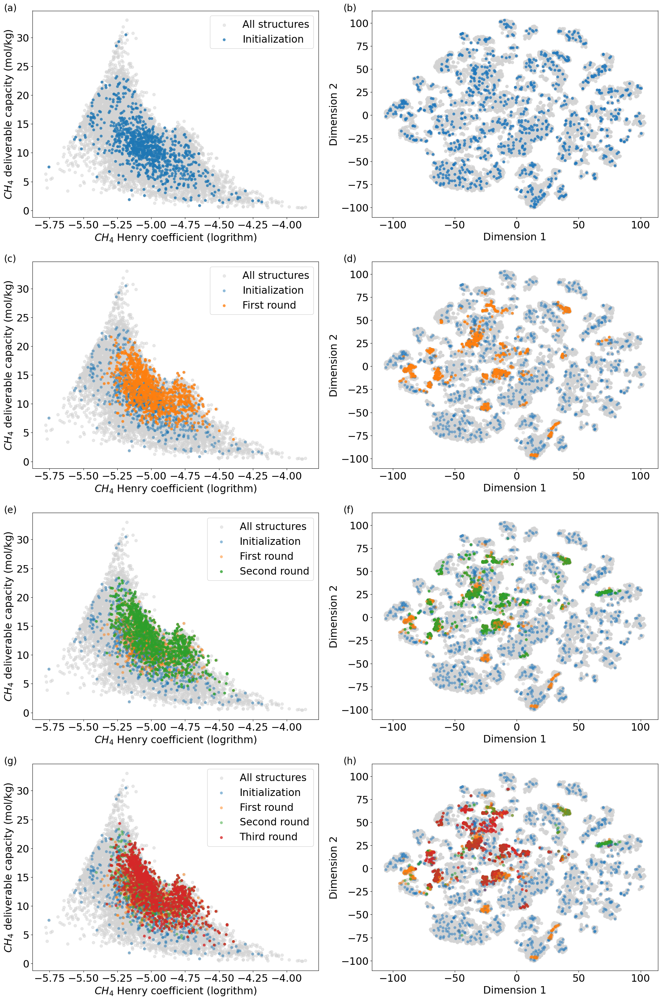

In [33]:
mpl.rcParams["font.size"] = 21.5
plt.rcParams["figure.figsize"] = (20,30)

fig, ax = plt.subplots(4, 2)

ax[0, 0].scatter(df["xq.ch4_logkh"].values, df["xq.ch4_wc"].values, color="lightgrey", label="All structures", alpha=.5)
ax[0, 0].scatter(kh1, np.array(ch4_wc1), label="Initialization", alpha=.8, ec=None)

ax[0, 1].scatter(emb_2d[:, 0], emb_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(all_mofs):
    if name in ch4_mof1:
        ax[0, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.8, ec=None) 


ax[1, 0].scatter(df["xq.ch4_logkh"].values, df["xq.ch4_uptake_6500000"].values-df["xq.ch4_uptake_580000"].values, color="lightgrey", label="All structures", alpha=.5)
ax[1, 0].scatter(kh1, np.array(ch4_wc1), label="Initialization", alpha=.5, ec=None)
ax[1, 0].scatter(kh2, np.array(ch4_wc2), label="First round", alpha=.8, ec=None)

ax[1, 1].scatter(emb_2d[:, 0], emb_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(all_mofs):
    if name in ch4_mof1:
        ax[1, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in ch4_mof2:
        ax[1, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#ff7f0e', alpha=.8, ec=None)


ax[2, 0].scatter(df["xq.ch4_logkh"].values, df["xq.ch4_uptake_6500000"].values-df["xq.ch4_uptake_580000"].values, color="lightgrey", label="All structures", alpha=.5)
ax[2, 0].scatter(kh1, np.array(ch4_wc1), label="Initialization", alpha=.5, ec=None)
ax[2, 0].scatter(kh2, np.array(ch4_wc2), label="First round", alpha=.5, ec=None)
ax[2, 0].scatter(kh3, np.array(ch4_wc3), label="Second round", alpha=.8, ec=None)

ax[2, 1].scatter(emb_2d[:, 0], emb_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(all_mofs):
    if name in ch4_mof1:
        ax[2, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in ch4_mof2:
        ax[2, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#ff7f0e', alpha=.5, ec=None)
    if name in ch4_mof3:
        ax[2, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#2ca02c', alpha=.8, ec=None)


ax[3, 0].scatter(df["xq.ch4_logkh"].values, df["xq.ch4_uptake_6500000"].values-df["xq.ch4_uptake_580000"].values, color="lightgrey", label="All structures", alpha=.5)
ax[3, 0].scatter(kh1, np.array(ch4_wc1), label="Initialization", alpha=.5, ec=None)
ax[3, 0].scatter(kh2, np.array(ch4_wc2), label="First round", alpha=.5, ec=None)
ax[3, 0].scatter(kh3, np.array(ch4_wc3), label="Second round", alpha=.5, ec=None)
ax[3, 0].scatter(kh4, np.array(ch4_wc4), label="Third round", alpha=.8, ec=None)

ax[3, 1].scatter(emb_2d[:, 0], emb_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(all_mofs):
    if name in ch4_mof1:
        ax[3, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in ch4_mof2:
        ax[3, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#ff7f0e', alpha=.5, ec=None)
    if name in ch4_mof3:
        ax[3, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#2ca02c', alpha=.5, ec=None)
    if name in ch4_mof4:
        ax[3, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#d62728', alpha=.8, ec=None)
        
for i, axs in enumerate(ax.flat):
    axs.text(-0.1, 1.0, f'({chr(97 + i)})', transform=axs.transAxes, size=20) 

for i in range(4):
    ax[i, 0].set_xlabel("$CH_4$ Henry coefficient (logrithm)")
    ax[i, 0].set_ylabel("$CH_4$ deliverable capacity (mol/kg)")
    ax[i, 0].legend()
for i in range(4):
    ax[i, 1].set_xlabel("Dimension 1")
    ax[i, 1].set_ylabel("Dimension 2")

plt.tight_layout()
# fig.savefig("/Users/xiaoqi/Documents/projects/proj_unsupervisedML/files/figures_oct23/2-ch4_revolution_v11.10.4.png", dpi=300)

/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_43170/1966597840.py:85: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


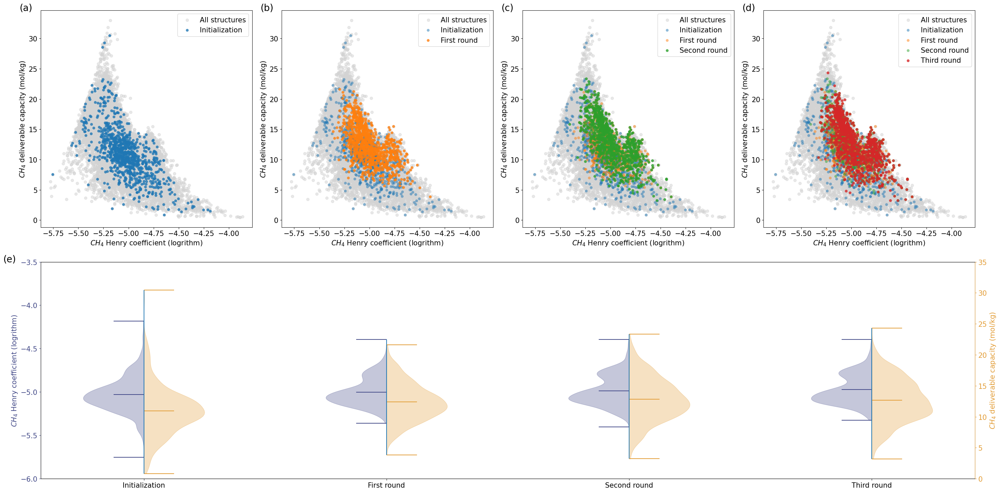

In [34]:
mpl.rcParams["font.size"] = 15

fig = plt.figure(figsize=(30, 15), layout="constrained")
spec = fig.add_gridspec(2, 4)

ax0 = fig.add_subplot(spec[0, 0])
ax0.scatter(df["xq.ch4_logkh"].values, df["xq.ch4_wc"].values, color="lightgrey", label="All structures", alpha=.5)
ax0.scatter(kh1, np.array(ch4_wc1), label="Initialization", alpha=.8, ec=None)

ax1 = fig.add_subplot(spec[0, 1])
ax1.scatter(df["xq.ch4_logkh"].values, df["xq.ch4_uptake_6500000"].values-df["xq.ch4_uptake_580000"].values, color="lightgrey", label="All structures", alpha=.5)
ax1.scatter(kh1, np.array(ch4_wc1), label="Initialization", alpha=.5, ec=None)
ax1.scatter(kh2, np.array(ch4_wc2), label="First round", alpha=.8, ec=None)

ax2 = fig.add_subplot(spec[0, 2])
ax2.scatter(df["xq.ch4_logkh"].values, df["xq.ch4_uptake_6500000"].values-df["xq.ch4_uptake_580000"].values, color="lightgrey", label="All structures", alpha=.5)
ax2.scatter(kh1, np.array(ch4_wc1), label="Initialization", alpha=.5, ec=None)
ax2.scatter(kh2, np.array(ch4_wc2), label="First round", alpha=.5, ec=None)
ax2.scatter(kh3, np.array(ch4_wc3), label="Second round", alpha=.8, ec=None)

ax3 = fig.add_subplot(spec[0, 3])
ax3.scatter(df["xq.ch4_logkh"].values, df["xq.ch4_uptake_6500000"].values-df["xq.ch4_uptake_580000"].values, color="lightgrey", label="All structures", alpha=.5)
ax3.scatter(kh1, np.array(ch4_wc1), label="Initialization", alpha=.5, ec=None)
ax3.scatter(kh2, np.array(ch4_wc2), label="First round", alpha=.5, ec=None)
ax3.scatter(kh3, np.array(ch4_wc3), label="Second round", alpha=.5, ec=None)
ax3.scatter(kh4, np.array(ch4_wc4), label="Third round", alpha=.8, ec=None)

ax4 = fig.add_subplot(spec[1, :])
v1 = ax4.violinplot([kh1, kh2, kh3, kh4],
               showmeans=True, showextrema=True)
for b in v1['bodies']:
    # get the center
    m = np.mean(b.get_paths()[0].vertices[:, 0])
    # modify the paths to not go further right than the center
    b.get_paths()[0].vertices[:, 0] = np.clip(b.get_paths()[0].vertices[:, 0], -np.inf, m)
    b.set_color('#414887')
for lines in [v1['cmeans'], v1['cmaxes'], v1['cmins']]:
    # get the center
    paths = lines.get_paths()
    for l in paths:
        m = np.mean(l.vertices[:, 0])
        l.vertices[:, 0] = np.clip(l.vertices[:, 0], -np.inf, m)
        lines.set_color('#414887')
ax4.spines['left'].set_color('#414887')

ax5 = plt.twinx()
v2 = ax5.violinplot([ch4_wc1, ch4_wc2, ch4_wc3, ch4_wc4], 
               showmeans=True, showextrema=True)

for b in v2['bodies']:
    # get the center
    m = np.mean(b.get_paths()[0].vertices[:, 0])
    # modify the paths to not go further left than the center
    b.get_paths()[0].vertices[:, 0] = np.clip(b.get_paths()[0].vertices[:, 0], m, np.inf)
    b.set_color('#E29C35')
for lines in [v2['cmeans'], v2['cmaxes'], v2['cmins']]:
    # get the center
    paths = lines.get_paths()
    for l in paths:
        m = np.mean(l.vertices[:, 0])
        # modify the paths to not go further right than the center
        l.vertices[:, 0] = np.clip(l.vertices[:, 0], m, np.inf)
        lines.set_color('#E29C35')
ax5.spines['right'].set_color('#E29C35')

ax4.set_xticks([1, 2, 3, 4], ["Initialization", "First round", "Second round", "Third round"])
ax4.set_ylabel("$CH_4$ Henry coefficient (logrithm)", color='#414887')
ax4.tick_params(axis='y', colors='#414887')
ax5.set_ylabel("$CH_4$ deliverable capacity (mol/kg)", color='#E29C35')
ax5.tick_params(axis='y', colors='#E29C35')
ax4.set_ylim([-6, -3.5])
ax5.set_ylim([0, 35])

for i, ax in enumerate([ax0, ax1, ax2, ax3, ax4]):
    if i != 4:
        ax.text(-0.1, 1.0, f'({chr(97 + i)})', transform=ax.transAxes, size=20) 
    else:
        ax.text(-0.04, 1.0, f'({chr(97 + i)})', transform=ax.transAxes, size=20) 

for ax in [ax0, ax1, ax2, ax3]:
    ax.set_xlabel("$CH_4$ Henry coefficient (logrithm)")
    ax.set_ylabel("$CH_4$ deliverable capacity (mol/kg)")
    ax.legend()

plt.tight_layout()

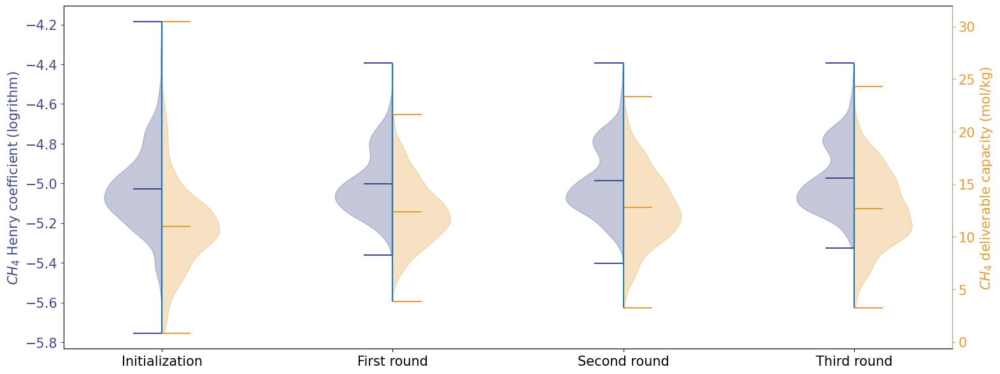

In [35]:
fig, ax = plt.subplots(figsize=(18, 7))

v1 = ax.violinplot([kh1, kh2, kh3, kh4],
               showmeans=True, showextrema=True)
for b in v1['bodies']:
    # get the center
    m = np.mean(b.get_paths()[0].vertices[:, 0])
    # modify the paths to not go further right than the center
    b.get_paths()[0].vertices[:, 0] = np.clip(b.get_paths()[0].vertices[:, 0], -np.inf, m)
    b.set_color('#414887')
for lines in [v1['cmeans'], v1['cmaxes'], v1['cmins']]:
    # get the center
    paths = lines.get_paths()
    for l in paths:
        m = np.mean(l.vertices[:, 0])
        l.vertices[:, 0] = np.clip(l.vertices[:, 0], -np.inf, m)
        lines.set_color('#414887')
ax.spines['left'].set_color('#414887')

ax2 = plt.twinx()
v2 = ax2.violinplot([ch4_wc1, ch4_wc2, ch4_wc3, ch4_wc4], 
               showmeans=True, showextrema=True)

for b in v2['bodies']:
    # get the center
    m = np.mean(b.get_paths()[0].vertices[:, 0])
    # modify the paths to not go further left than the center
    b.get_paths()[0].vertices[:, 0] = np.clip(b.get_paths()[0].vertices[:, 0], m, np.inf)
    b.set_color('#E29C35')
for lines in [v2['cmeans'], v2['cmaxes'], v2['cmins']]:
    # get the center
    paths = lines.get_paths()
    for l in paths:
        m = np.mean(l.vertices[:, 0])
        # modify the paths to not go further right than the center
        l.vertices[:, 0] = np.clip(l.vertices[:, 0], m, np.inf)
        lines.set_color('#E29C35')
ax2.spines['right'].set_color('#E29C35')

ax.set_xticks([1, 2, 3, 4], ["Initialization", "First round", "Second round", "Third round"])
ax.set_ylabel("$CH_4$ Henry coefficient (logrithm)", color='#414887')
ax.tick_params(axis='y', colors='#414887')
ax2.set_ylabel("$CH_4$ deliverable capacity (mol/kg)", color='#E29C35')
ax2.tick_params(axis='y', colors='#E29C35')

## Case 2. CO2/N2 separation

In [36]:
CO2_TARGETS = ["xq.co2_n2_selectivity", "xq.co2_n2_wc"]

In [37]:
df[df["xq.co2_n2_selectivity"] > 240]

,Density,ASA,vASA,gASA,NASA,gNASA,vNASA,AVA,AVAf,AVAg,...,outputs.CH4DC,outputs.CH4HPSTP,outputs.CH4LPSTP,info.basename,info.doi,info.title,info.abs,info.year,xq.ch4_wc,xq.co2_n2_selectivity
2708,0.663005,1675.93,1952.45,2944.85,0.0,0.0,0.0,2806.71,0.32698,0.493178,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.003587,511.109800
11825,0.516995,1897.62,2210.72,4276.09,0.0,0.0,0.0,3029.20,0.35290,0.682599,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.509605,273.099528
15703,0.300496,4818.32,1638.76,5453.53,0.0,0.0,0.0,15705.50,0.53416,1.777600,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.856820,369.756903


In [38]:
N = 1000
N_top = int(N/80)

In [39]:
random.seed(4728) # 3388
co2_mof1 = random.choices(arc_model.dv.index_to_key, k=N)
[sel1, co2_wc1] = target_mapping(df, ARC_ID, CO2_TARGETS, co2_mof1)

In [40]:
explored_co2_mofs = co2_mof1
[explored_co2_sel, explored_co2_wc] = target_mapping(df, ARC_ID, CO2_TARGETS, explored_co2_mofs)

In [41]:
co2_top1 = top_rank(explored_co2_mofs, [explored_co2_sel, explored_co2_wc], N_top)

In [42]:
co2_mof2, [sel2, co2_wc2], co2_cos1 = batch_recommendation(arc_model, co2_top1, df, ARC_ID, CO2_TARGETS, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81
Current ratio: 0.7290000000000001


In [43]:
explored_co2_mofs =  np.unique(np.concatenate((co2_mof1, co2_mof2)))
[explored_co2_sel, explored_co2_wc] = target_mapping(df, ARC_ID, CO2_TARGETS, explored_co2_mofs)

In [44]:
co2_top2 = top_rank(explored_co2_mofs, [explored_co2_sel, explored_co2_wc], N_top)

In [45]:
co2_mof3, [sel3, co2_wc3], co2_cos2 = batch_recommendation(arc_model, co2_top2, df, ARC_ID, CO2_TARGETS, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81
Current ratio: 0.7290000000000001
Current ratio: 0.6561000000000001


In [46]:
explored_co2_mofs =  np.unique(np.concatenate((co2_mof1, co2_mof2, co2_mof3)))
[explored_co2_sel, explored_co2_wc] = target_mapping(df, ARC_ID, CO2_TARGETS, explored_co2_mofs)

In [47]:
co2_top3 = top_rank(explored_co2_mofs, [explored_co2_sel, explored_co2_wc], N_top)

In [48]:
co2_mof4, [sel4, co2_wc4], co2_cos3 = batch_recommendation(arc_model, co2_top3, df, ARC_ID, CO2_TARGETS, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81
Current ratio: 0.7290000000000001
Current ratio: 0.6561000000000001
Current ratio: 0.5904900000000002
Current ratio: 0.5314410000000002


In [49]:
explored_co2_mofs =  np.unique(np.concatenate((co2_mof1, co2_mof2, co2_mof3, co2_mof4)))
[explored_co2_sel, explored_co2_wc] = target_mapping(df, ARC_ID, CO2_TARGETS, explored_co2_mofs)

In [50]:
co2_top4 = top_rank(explored_co2_mofs, [explored_co2_sel, explored_co2_wc], N_top)

In [51]:
co2_mof5, [sel5, co2_wc5], co2_cos4 = batch_recommendation(arc_model, co2_top4, df, ARC_ID, CO2_TARGETS, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81
Current ratio: 0.7290000000000001
Current ratio: 0.6561000000000001
Current ratio: 0.5904900000000002
Current ratio: 0.5314410000000002


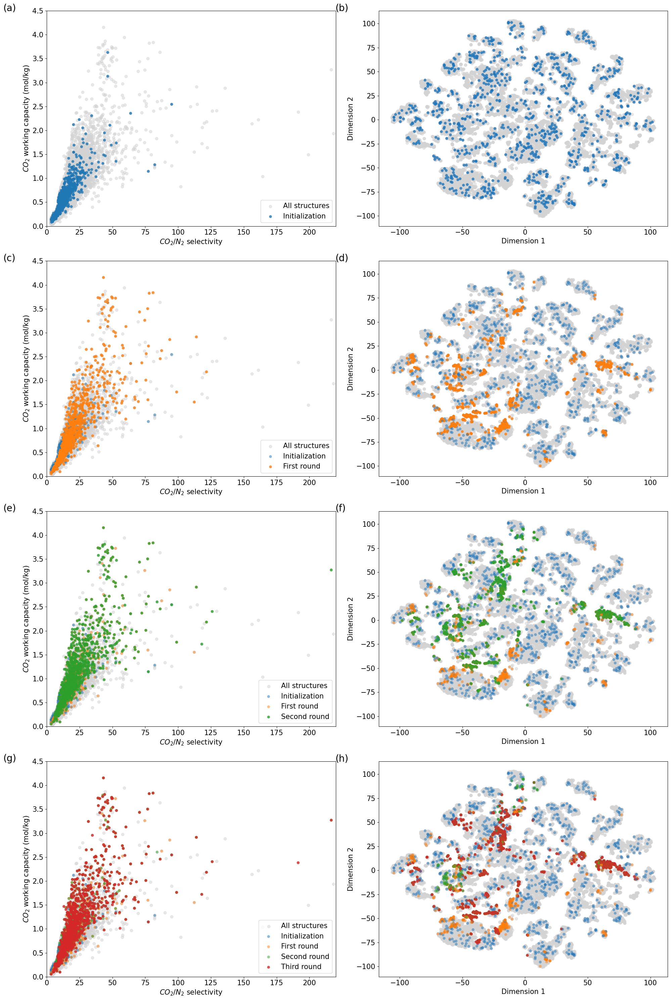

In [52]:
plt.rcParams["figure.figsize"] = (20,30)

fig, ax = plt.subplots(4, 2)

ax[0, 0].scatter(df["xq.co2_n2_selectivity"].values, df["xq.co2_n2_wc"].values, color="lightgrey", label="All structures", alpha=.5)
ax[0, 0].scatter(sel1, np.array(co2_wc1), label="Initialization", alpha=.8, ec=None)

ax[0, 1].scatter(emb_2d[:, 0], emb_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(all_mofs):
    if name in co2_mof1:
        ax[0, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.8, ec=None) 


ax[1, 0].scatter(df["xq.co2_n2_selectivity"].values, df["xq.co2_n2_wc"].values, color="lightgrey", label="All structures", alpha=.5)
ax[1, 0].scatter(sel1, np.array(co2_wc1), label="Initialization", alpha=.5, ec=None)
ax[1, 0].scatter(sel2, np.array(co2_wc2), label="First round", alpha=.8, ec=None)

ax[1, 1].scatter(emb_2d[:, 0], emb_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(all_mofs):
    if name in co2_mof1:
        ax[1, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in co2_mof2:
        ax[1, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#ff7f0e', alpha=.8, ec=None)


ax[2, 0].scatter(df["xq.co2_n2_selectivity"].values, df["xq.co2_n2_wc"].values, color="lightgrey", label="All structures", alpha=.5)
ax[2, 0].scatter(sel1, np.array(co2_wc1), label="Initialization", alpha=.5, ec=None)
ax[2, 0].scatter(sel2, np.array(co2_wc2), label="First round", alpha=.5, ec=None)
ax[2, 0].scatter(sel3, np.array(co2_wc3), label="Second round", alpha=.8, ec=None)

ax[2, 1].scatter(emb_2d[:, 0], emb_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(all_mofs):
    if name in co2_mof1:
        ax[2, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in co2_mof2:
        ax[2, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#ff7f0e', alpha=.5, ec=None)
    if name in co2_mof3:
        ax[2, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#2ca02c', alpha=.8, ec=None)


ax[3, 0].scatter(df["xq.co2_n2_selectivity"].values, df["xq.co2_n2_wc"].values, color="lightgrey", label="All structures", alpha=.5)
ax[3, 0].scatter(sel1, np.array(co2_wc1), label="Initialization", alpha=.5, ec=None)
ax[3, 0].scatter(sel2, np.array(co2_wc2), label="First round", alpha=.5, ec=None)
ax[3, 0].scatter(sel3, np.array(co2_wc3), label="Second round", alpha=.5, ec=None)
ax[3, 0].scatter(sel4, np.array(co2_wc4), label="Third round", alpha=.8, ec=None)

ax[3, 1].scatter(emb_2d[:, 0], emb_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(all_mofs):
    if name in co2_mof1:
        ax[3, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in co2_mof2:
        ax[3, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#ff7f0e', alpha=.5, ec=None)
    if name in co2_mof3:
        ax[3, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#2ca02c', alpha=.5, ec=None)
    if name in co2_mof4:
        ax[3, 1].scatter(emb_2d[i, 0], emb_2d[i, 1], color='#d62728', alpha=.8, ec=None)
        

for i, axs in enumerate(ax.flat):
    axs.text(-0.15, 1.0, f'({chr(97 + i)})', transform=axs.transAxes, size=20) 

for i in range(4):
    ax[i, 0].set_xlabel("$CO_2/N_2$ selectivity")
    ax[i, 0].set_ylabel("$CO_2$ working capacity (mol/kg)")
    ax[i, 0].set_xlim([0, 220])
    ax[i, 0].set_ylim([0, 4.5])
    ax[i, 0].legend(loc='lower right')
for i in range(4):
    ax[i, 1].set_xlabel("Dimension 1")
    ax[i, 1].set_ylabel("Dimension 2")

plt.tight_layout()
# fig.savefig("/Users/xiaoqi/Documents/projects/proj_unsupervisedML/files/figures_oct23/3-co2_n2_revolution_v24.01.29.png", dpi=300)

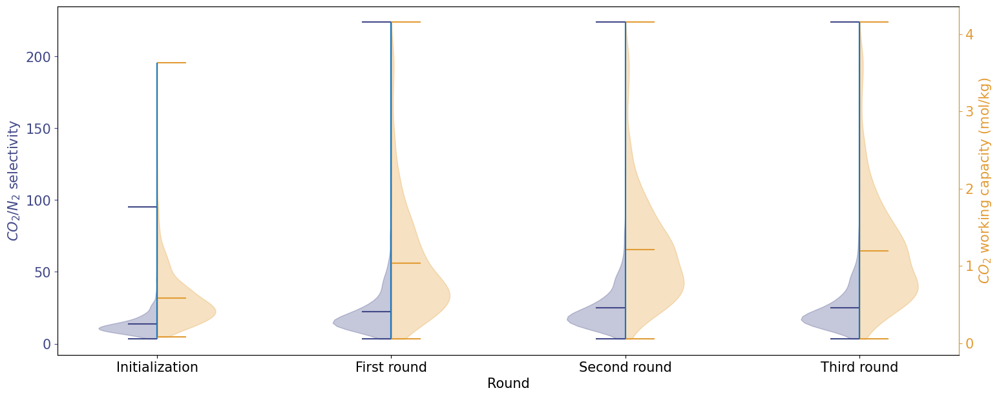

In [53]:
fig, ax = plt.subplots(figsize=(18, 7))

v1 = ax.violinplot([sel1, sel2, sel3, sel4],
               showmeans=True, showextrema=True)
for b in v1['bodies']:
    # get the center
    m = np.mean(b.get_paths()[0].vertices[:, 0])
    # modify the paths to not go further right than the center
    b.get_paths()[0].vertices[:, 0] = np.clip(b.get_paths()[0].vertices[:, 0], -np.inf, m)
    b.set_color('#414887')
for lines in [v1['cmeans'], v1['cmaxes'], v1['cmins']]:
    # get the center
    paths = lines.get_paths()
    for l in paths:
        m = np.mean(l.vertices[:, 0])
        l.vertices[:, 0] = np.clip(l.vertices[:, 0], -np.inf, m)
        lines.set_color('#414887')
ax.spines['left'].set_color('#414887')

ax2 = plt.twinx()
v2 = ax2.violinplot([co2_wc1, co2_wc2, co2_wc3, co2_wc4], 
               showmeans=True, showextrema=True)

for b in v2['bodies']:
    # get the center
    m = np.mean(b.get_paths()[0].vertices[:, 0])
    # modify the paths to not go further left than the center
    b.get_paths()[0].vertices[:, 0] = np.clip(b.get_paths()[0].vertices[:, 0], m, np.inf)
    b.set_color('#E29C35')
for lines in [v2['cmeans'], v2['cmaxes'], v2['cmins']]:
    # get the center
    paths = lines.get_paths()
    for l in paths:
        m = np.mean(l.vertices[:, 0])
        # modify the paths to not go further right than the center
        l.vertices[:, 0] = np.clip(l.vertices[:, 0], m, np.inf)
        lines.set_color('#E29C35')
ax2.spines['right'].set_color('#E29C35')

ax.set_xticks([1, 2, 3, 4], ['Initialization', 'First round', 'Second round', 'Third round'])
ax.set_xlabel("Round")
ax.set_ylabel("$CO_2/N_2$ selectivity", color='#414887')
ax.tick_params(axis='y', colors='#414887')
ax2.set_ylabel("$CO_2$ working capacity (mol/kg)", color='#E29C35')
ax2.tick_params(axis='y', colors='#E29C35')
#ax.legend([v1['bodies'][0],v2['bodies'][0]],['data1', 'data2'])

In [54]:
co2_wc1_filled = np.nan_to_num(co2_wc1, copy=True, nan=np.nanmean(co2_wc1))
co2_wc2_filled = np.nan_to_num(co2_wc2, copy=True, nan=np.nanmean(co2_wc2))
co2_wc3_filled = np.nan_to_num(co2_wc3, copy=True, nan=np.nanmean(co2_wc3))
co2_wc4_filled = np.nan_to_num(co2_wc4, copy=True, nan=np.nanmean(co2_wc4))

/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_43170/3171803963.py:86: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


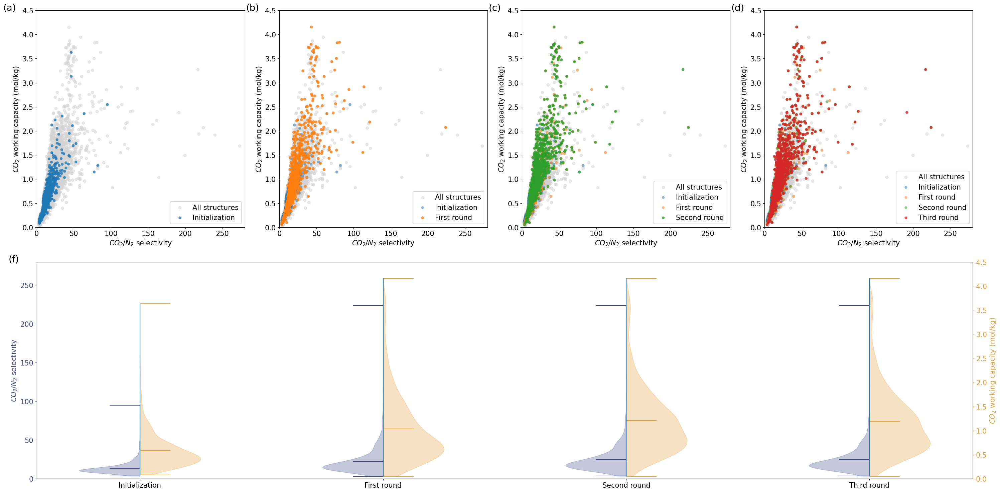

In [55]:
mpl.rcParams["font.size"] = 15

fig = plt.figure(figsize=(30, 15), layout="constrained")
spec = fig.add_gridspec(2, 4)

ax0 = fig.add_subplot(spec[0, 0])
ax0.scatter(df["xq.co2_n2_selectivity"].values, df["xq.co2_n2_wc"].values, color="lightgrey", label="All structures", alpha=.5)
ax0.scatter(sel1, np.array(co2_wc1), label="Initialization", alpha=.8, ec=None)

ax1 = fig.add_subplot(spec[0, 1])
ax1.scatter(df["xq.co2_n2_selectivity"].values, df["xq.co2_n2_wc"].values, color="lightgrey", label="All structures", alpha=.5)
ax1.scatter(sel1, np.array(co2_wc1), label="Initialization", alpha=.5, ec=None)
ax1.scatter(sel2, np.array(co2_wc2), label="First round", alpha=.8, ec=None)

ax2 = fig.add_subplot(spec[0, 2])
ax2.scatter(df["xq.co2_n2_selectivity"].values, df["xq.co2_n2_wc"].values, color="lightgrey", label="All structures", alpha=.5)
ax2.scatter(sel1, np.array(co2_wc1), label="Initialization", alpha=.5, ec=None)
ax2.scatter(sel2, np.array(co2_wc2), label="First round", alpha=.5, ec=None)
ax2.scatter(sel3, np.array(co2_wc3), label="Second round", alpha=.8, ec=None)

ax3 = fig.add_subplot(spec[0, 3])
ax3.scatter(df["xq.co2_n2_selectivity"].values, df["xq.co2_n2_wc"].values, color="lightgrey", label="All structures", alpha=.5)
ax3.scatter(sel1, np.array(co2_wc1), label="Initialization", alpha=.5, ec=None)
ax3.scatter(sel2, np.array(co2_wc2), label="First round", alpha=.5, ec=None)
ax3.scatter(sel3, np.array(co2_wc3), label="Second round", alpha=.5, ec=None)
ax3.scatter(sel4, np.array(co2_wc4), label="Third round", alpha=.8, ec=None)

ax4 = fig.add_subplot(spec[1, :])
v1 = ax4.violinplot([sel1, sel2, sel3, sel4],
               showmeans=True, showextrema=True)
for b in v1['bodies']:
    # get the center
    m = np.mean(b.get_paths()[0].vertices[:, 0])
    # modify the paths to not go further right than the center
    b.get_paths()[0].vertices[:, 0] = np.clip(b.get_paths()[0].vertices[:, 0], -np.inf, m)
    b.set_color('#414887')
for lines in [v1['cmeans'], v1['cmaxes'], v1['cmins']]:
    # get the center
    paths = lines.get_paths()
    for l in paths:
        m = np.mean(l.vertices[:, 0])
        l.vertices[:, 0] = np.clip(l.vertices[:, 0], -np.inf, m)
        lines.set_color('#414887')
ax4.spines['left'].set_color('#414887')

ax5 = plt.twinx()
v2 = ax5.violinplot([co2_wc1_filled, co2_wc2_filled, co2_wc3_filled, co2_wc4_filled], 
               showmeans=True, showextrema=True)
for b in v2['bodies']:
    # get the center
    m = np.mean(b.get_paths()[0].vertices[:, 0])
    # modify the paths to not go further left than the center
    b.get_paths()[0].vertices[:, 0] = np.clip(b.get_paths()[0].vertices[:, 0], m, np.inf)
    b.set_color('#E29C35')
for lines in [v2['cmeans'], v2['cmaxes'], v2['cmins']]:
    # get the center
    paths = lines.get_paths()
    for l in paths:
        m = np.mean(l.vertices[:, 0])
        # modify the paths to not go further right than the center
        l.vertices[:, 0] = np.clip(l.vertices[:, 0], m, np.inf)
        lines.set_color('#E29C35')
ax5.spines['right'].set_color('#E29C35')

ax4.set_xticks([1, 2, 3, 4], ["Initialization", "First round", "Second round", "Third round"])
ax4.set_ylabel("$CO_2/N_2$ selectivity", color='#414887')
ax4.tick_params(axis='y', colors='#414887')
ax5.set_ylabel("$CO_2$ working capacity (mol/kg)", color='#E29C35')
ax5.tick_params(axis='y', colors='#E29C35')
ax4.set_ylim([0, 280])
ax5.set_ylim([0, 4.5])

for i, ax in enumerate([ax0, ax1, ax2, ax3, ax4]):
    if i != 4:
        ax.text(-0.16, 1.0, f'({chr(97 + i)})', transform=ax.transAxes, size=20)
    else:
        ax.text(-0.03, 1.0, f'({chr(97 + i + 1)})', transform=ax.transAxes, size=20)

for ax in [ax0, ax1, ax2, ax3]:
    ax.set_xlabel("$CO_2/N_2$ selectivity")
    ax.set_ylabel("$CO_2$ working capacity (mol/kg)")
    ax.set_xlim([0, 280])
    ax.set_ylim([0, 4.5])
    ax.legend(loc="lower right")

plt.tight_layout()

## SI. Bandgap

### 1. Loading data

In [56]:
QMOF_MODEL_PATH = "../experiments/workflow/wandb/offline-run-20231031_183003-6cc81vtq/tmp/embedding_model.pt"

QMOF_CORPUS_CONFIG = {
  "embed_label": True,
  "label_path": "../data/qmof-data.csv",
  "descriptors_to_embed": ["info.pld", "info.lcd", "info.density"],
  "category_to_embed": [],
  "tags_to_embed": [], 
  "id_column": "info.name",
  "wl_step": 2,
  "n_components": 2,
  "use_hash": False,
  "writing_style": "paragraph",
  "composition": False,
  "mode": "all",
  "embed_cif": False
}

QMOF_CIF = ["../data/cifs/qmof/"]

qmof_df = pd.read_csv("../data/qmof-data.csv")

/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_43170/1399437187.py:21: DtypeWarning: Columns (41,42,44,45,46,47,48,50,51,52,53,54,56,57,58,66,67,68,69,70,78,79,80,81,82,90,91,92,93,94) have mixed types. Specify dtype option on import or set low_memory=False.
  qmof_df = pd.read_csv("../data/qmof-data.csv")


In [57]:
qmof_model = Doc2Vec.load(QMOF_MODEL_PATH)

In [58]:
QMOF_ID = "qmof_id"
TARGET = ["outputs.pbe.bandgap"]

### 2. Embedding

In [59]:
qmofs = qmof_model.dv.index_to_key
qmof_emb = np.array([qmof_model.dv[x] for x in qmofs])
qmof_2d = projector.fit_transform(qmof_emb)
len(qmofs), qmof_2d.shape

(20375, (20375, 2))

In [60]:
def qmof_range(mofs, targets, ntop):
    target = targets[0]
    filtered_items = [(mof, tar) for mof, tar in zip(mofs, target) if (1 <= tar <= 3).all()]
    #top = random.choices([item[0] for item in filtered_items], k=ntop)
    return [item[0] for item in filtered_items]

### 3. For bandgap

#### 1. Initialization

In [61]:
N = 1000
N_top = int(N/20)

In [62]:
qmof1 = random.choices(qmof_df[QMOF_ID].values, k=N)
[bandgap1] = target_mapping(qmof_df, QMOF_ID, TARGET, qmof1) #np.array([qmof_df[qmof_df[QMOF_ID] == x][TARGET].values[0] for x in qmof1])

In [63]:
explored_qmof = qmof1
[explored_bg] = target_mapping(qmof_df, QMOF_ID, TARGET, explored_qmof)

In [64]:
qtop1 = qmof_range(explored_qmof, [explored_bg], N_top)

#### 2. 1st round

In [65]:
qmof2, [bandgap2], qmof_cos1 = batch_recommendation(qmof_model, qtop1, qmof_df, QMOF_ID, TARGET, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81


In [66]:
explored_qmof = np.unique(np.concatenate((qmof1, qmof2)))
[explored_bg] = target_mapping(qmof_df, QMOF_ID, TARGET, explored_qmof)

#### 3. 2nd round

In [67]:
qtop2 = qmof_range(explored_qmof, [explored_bg], N_top)

In [68]:
qmof3, [bandgap3], qmof_cos2 = batch_recommendation(qmof_model, qtop2, qmof_df, QMOF_ID, TARGET, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81
Current ratio: 0.7290000000000001


In [69]:
explored_qmof = np.unique(np.concatenate((qmof1, qmof2, qmof3)))
explored_bg = target_mapping(qmof_df, QMOF_ID, TARGET, explored_qmof)

#### 4. 3rd round

In [70]:
qtop3 = qmof_range(explored_qmof, explored_bg, N_top)

In [71]:
qmof4, [bandgap4], qmof_cos3 = batch_recommendation(qmof_model, qtop3, qmof_df, QMOF_ID, TARGET, N)

Current ratio: 1.0
Current ratio: 0.9
Current ratio: 0.81
Current ratio: 0.7290000000000001
Current ratio: 0.6561000000000001
Current ratio: 0.5904900000000002


In [72]:
explored_qmof = np.unique(np.concatenate((qmof1, qmof2, qmof3, qmof4)))
[explored_bg] = target_mapping(qmof_df, QMOF_ID, TARGET, explored_qmof)

In [73]:
import seaborn as sns

In [74]:
len(bandgap1), len(bandgap2), len(bandgap3), len(bandgap4)

(1000, 1000, 1000, 1000)

/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_43170/2045640447.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(ax=ax[0, 0], a=bandgap1, hist=True, label="Initialization")
/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_43170/2045640447.py:14: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6

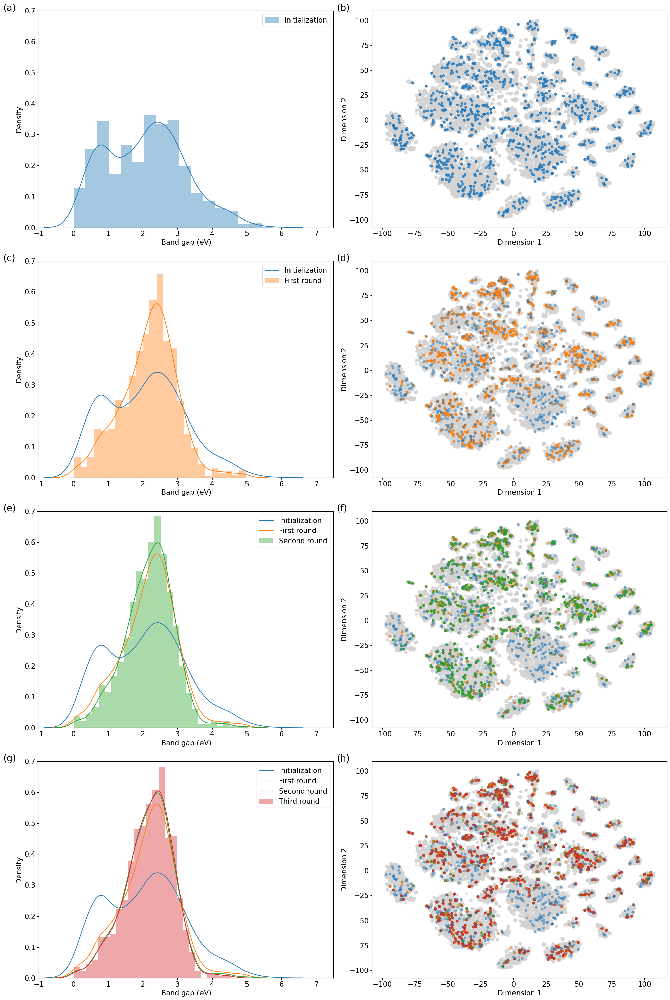

In [75]:
plt.rcParams["figure.figsize"] = (20,30)

fig, ax = plt.subplots(4, 2)

#ax[0, 0].hist(df["xq.co2_n2_selectivity"].values, df["xq.co2_n2_wc"].values, color="lightgrey", label="All structures", alpha=.5)
sns.distplot(ax=ax[0, 0], a=bandgap1, hist=True, label="Initialization")
# ax[0, 0].hist(bandgap1, bins=15, density=True, alpha=.8, label="Initialization")

ax[0, 1].scatter(qmof_2d[:, 0], qmof_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(qmofs):
    if name in qmof1:
        ax[0, 1].scatter(qmof_2d[i, 0], qmof_2d[i, 1], color='#1f77bc', alpha=.8, ec=None) 

sns.distplot(ax=ax[1, 0], a=bandgap1, hist=False, label="Initialization")
sns.distplot(ax=ax[1, 0], a=bandgap2, hist=True, label="First round")

ax[1, 1].scatter(qmof_2d[:, 0], qmof_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(qmofs):
    if name in qmof1:
        ax[1, 1].scatter(qmof_2d[i, 0], qmof_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in qmof2:
        ax[1, 1].scatter(qmof_2d[i, 0], qmof_2d[i, 1], color='#ff7f0e', alpha=.8, ec=None)


sns.distplot(ax=ax[2, 0], a=bandgap1, hist=False, label="Initialization")
sns.distplot(ax=ax[2, 0], a=bandgap2, hist=False, label="First round")
sns.distplot(ax=ax[2, 0], a=bandgap3, hist=True, label="Second round")

ax[2, 1].scatter(qmof_2d[:, 0], qmof_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(qmofs):
    if name in qmof1:
        ax[2, 1].scatter(qmof_2d[i, 0], qmof_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in qmof2:
        ax[2, 1].scatter(qmof_2d[i, 0], qmof_2d[i, 1], color='#ff7f0e', alpha=.5, ec=None)
    if name in qmof3:
        ax[2, 1].scatter(qmof_2d[i, 0], qmof_2d[i, 1], color='#2ca02c', alpha=.8, ec=None)


sns.distplot(ax=ax[3, 0], a=bandgap1, hist=False, label="Initialization")
sns.distplot(ax=ax[3, 0], a=bandgap2, hist=False, label="First round")
sns.distplot(ax=ax[3, 0], a=bandgap3, hist=False, label="Second round")
sns.distplot(ax=ax[3, 0], a=bandgap4, hist=True, label="Third round")

ax[3, 1].scatter(qmof_2d[:, 0], qmof_2d[:, 1], color="lightgrey", label="All structures", alpha=.5)
for i, name in enumerate(qmofs):
    if name in qmof1:
        ax[3, 1].scatter(qmof_2d[i, 0], qmof_2d[i, 1], color='#1f77bc', alpha=.5, ec=None)
    if name in qmof2:
        ax[3, 1].scatter(qmof_2d[i, 0], qmof_2d[i, 1], color='#ff7f0e', alpha=.5, ec=None)
    if name in qmof3:
        ax[3, 1].scatter(qmof_2d[i, 0], qmof_2d[i, 1], color='#2ca02c', alpha=.5, ec=None)
    if name in qmof4:
        ax[3, 1].scatter(qmof_2d[i, 0], qmof_2d[i, 1], color='#d62728', alpha=.8, ec=None)
        

for i, axs in enumerate(ax.flat):
    axs.text(-0.12, 1.0, f'({chr(97 + i)})', transform=axs.transAxes, size=20) 

for i in range(4):
    ax[i, 0].set_xlabel("Band gap (eV)")
    ax[i, 0].set_ylabel("Density")
    ax[i, 0].set_xlim([-1, 7.5])
    ax[i, 0].set_ylim([0, 0.7])
    ax[i, 0].legend()
for i in range(4):
    ax[i, 1].set_xlabel("Dimension 1")
    ax[i, 1].set_ylabel("Dimension 2")

plt.tight_layout()
# fig.savefig("/Users/xiaoqi/Documents/projects/proj_unsupervisedML/files/figures_oct23/3.5-bandgap_revolution_v24.01.29.png", dpi=300)

# Section 2. Substructures analysis

# Section 4. Substructure similarities

# Section 5. K-means cluster

In [76]:
df = df[df[ARC_ID].isin(all_mofs)]

In [77]:
df["xq.ch4_logkh_rank"] = len(df) - ss.rankdata(df["xq.ch4_logkh"])
df["xq.ch4_wc_rank"] = len(df) - ss.rankdata(df["xq.ch4_wc"])

df["xq.co2_n2_selectivity_rank"] = len(df) - ss.rankdata(df["xq.co2_n2_selectivity"])
df["xq.co2_n2_wc_rank"] = len(df) - ss.rankdata(df["xq.co2_n2_wc"])

In [78]:
df['xq.ch4_rank'] = df["xq.ch4_logkh_rank"].values + df["xq.ch4_wc_rank"].values
df['xq.co2_rank'] = df["xq.co2_n2_selectivity_rank"].values + df["xq.co2_n2_wc_rank"].values

In [79]:
ch4_best = df[(df["xq.ch4_rank"] < 8500)][ARC_ID].values
co2_best = df[(df["xq.co2_rank"] < 300)][ARC_ID].values

len(ch4_best), len(co2_best)

(108, 99)

In [80]:
explored_ch4_mofs_5r = np.unique(np.concatenate((ch4_mof1, ch4_mof2, ch4_mof3, ch4_mof4, ch4_mof5)))

In [81]:
recm_ch4_best = top_rank(explored_ch4_mofs_5r,[explored_ch4_kh, explored_ch4_wc], 108)
recm_co2_best = top_rank(explored_co2_mofs,[explored_co2_sel, explored_co2_wc], 99)

In [82]:
cover_ch4 = set(ch4_best).intersection(set(recm_ch4_best))
cover_co2 = set(co2_best).intersection(set(recm_co2_best))

cover_percentage_ch4 = len(cover_ch4) / len(ch4_best)
cover_percentage_co2 = len(cover_co2) / len(co2_best)

cover_percentage_ch4, cover_percentage_co2

(0.4444444444444444, 0.6161616161616161)

In [83]:
print(len(set(ch4_mof2).intersection(set(ch4_mof1))))
print(len(set(ch4_mof3).intersection(set(ch4_mof2))))
print(len(set(ch4_mof4).intersection(set(ch4_mof3))))
print(len(set(ch4_mof5).intersection(set(ch4_mof4))))

50
521
696
917


In [84]:
import math

def hypergeometric_pmf(N, K, n, k):
    numerator = math.comb(K, k) * math.comb(N - K, n - k)
    denominator = math.comb(N, n)
    return numerator / denominator

# Total number of MOFs
N = 22035
# Total number of candidates
K = 100
# Number of MOFs drawn n

# Calculate the probability of finding exactly k candidates for k from 0 to 108
percentages = []
probabs = []
for n in (2000, 4000, 6000, 8000, 10000):
    probability = []
    percentage = []
    for k in range(0, K + 1):
        probability.append(hypergeometric_pmf(N, K, n, k))
        percentage.append(k/K * 100)
    probabs.append(probability)
    percentages.append(percentage)

Text(0, 0.5, 'Probability')

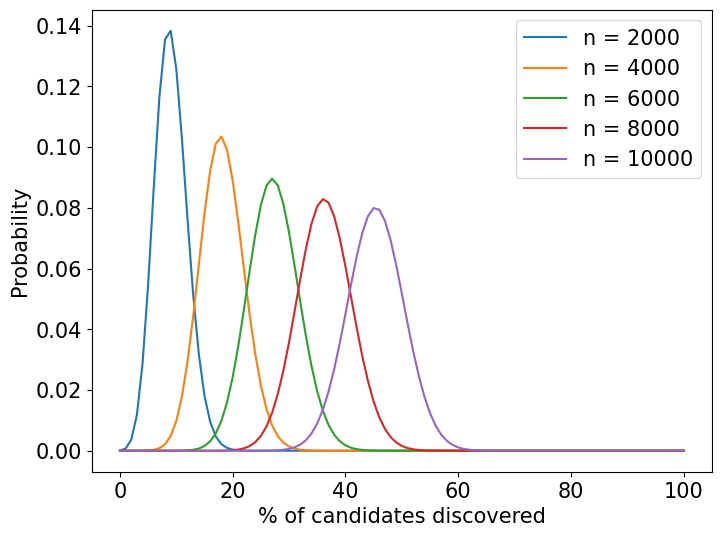

In [85]:
plt.figure(figsize=(8, 6))
probabs = np.array(probabs)
percentages = np.array(percentages)
for i, n in enumerate([2000, 4000, 6000, 8000, 10000]):
    plt.plot(percentages[i], probabs[i], label=f"n = {n}")
    
plt.legend()
plt.xlabel("% of candidates discovered")
plt.ylabel("Probability")

In [86]:
len(all_mofs)

22035

In [87]:
len(np.unique(explored_ch4_mofs))/len(all_mofs), len(np.unique(explored_co2_mofs))/len(all_mofs)

(0.12194236442024052, 0.11831177671885637)

In [88]:
ch4_ranks = []
for name in all_mofs:
    rank = df[df[ARC_ID] == name]['xq.ch4_rank'].values[0]  # Assuming 'name' is the column with MOF names and 'rank' is the column with ranks
    if rank < df['xq.ch4_rank'].quantile(0.2):
        ch4_ranks.append(0)
    elif rank < df['xq.ch4_rank'].quantile(0.4):
        ch4_ranks.append(1)
    elif rank < df['xq.ch4_rank'].quantile(0.6):
        ch4_ranks.append(2)
    elif rank < df['xq.ch4_rank'].quantile(0.8):
        ch4_ranks.append(3)
    else:
        ch4_ranks.append(4)


In [89]:
co2_ranks = []
for name in all_mofs:
    rank = df[df[ARC_ID] == name]['xq.co2_rank'].values[0]  # Assuming 'name' is the column with MOF names and 'rank' is the column with ranks
    if rank < df['xq.co2_rank'].quantile(0.2):
        co2_ranks.append(0)
    elif rank < df['xq.co2_rank'].quantile(0.4):
        co2_ranks.append(1)
    elif rank < df['xq.co2_rank'].quantile(0.6):
        co2_ranks.append(2)
    elif rank < df['xq.co2_rank'].quantile(0.8):
        co2_ranks.append(3)
    else:
        co2_ranks.append(4)

/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_43170/3305559677.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('Set3_r', 5)
/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_43170/3305559677.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


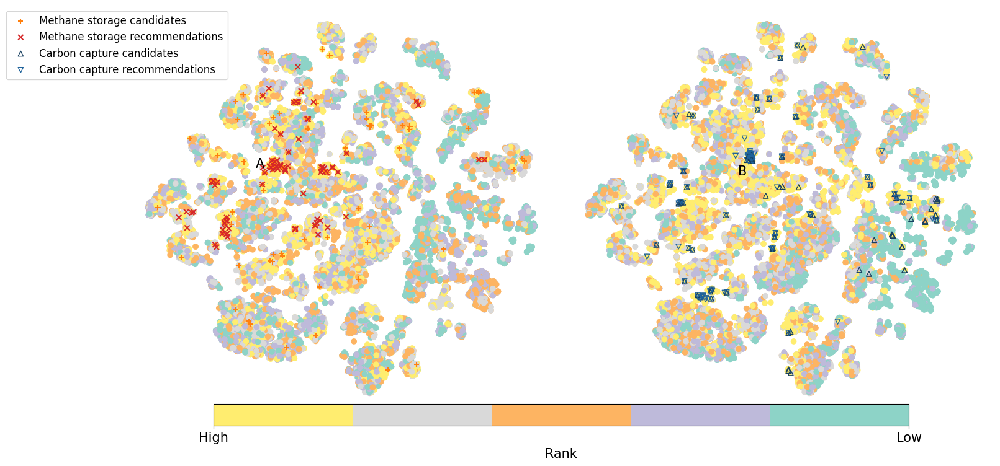

In [90]:
fig, ax = plt.subplots(1, 2, figsize=(16, 7))

cmap = plt.cm.get_cmap('Set3_r', 5)
scatter1 = ax[0].scatter(emb_2d[:, 0], emb_2d[:, 1], c=ch4_ranks, cmap=cmap, alpha=1)
scatter2 = ax[1].scatter(emb_2d[:, 0], emb_2d[:, 1], c=co2_ranks, cmap=cmap, alpha=1)

ax[0].axis('off')
ax[1].axis('off')
for i, name in enumerate(all_mofs):
    if name in ch4_best: 
        ax[0].scatter(emb_2d[i, 0], emb_2d[i, 1], marker='+', ec='#ff7f0e', facecolors='none')
    if name in recm_ch4_best:
        ax[0].scatter(emb_2d[i, 0], emb_2d[i, 1], marker='x', ec='#d62728', facecolors='none')  
    if name in co2_best: #
        ax[1].scatter(emb_2d[i, 0], emb_2d[i, 1], marker='^', ec='#173f5f', facecolors='none')
    if name in recm_co2_best:
        ax[1].scatter(emb_2d[i, 0], emb_2d[i, 1], marker='v', ec='#20639b', facecolors='none')

ax[0].text(-48, 24, "A")
ax[1].text(-25, 20, "B")

cbar_ax = fig.add_axes([0.2, 0, 0.7, 0.05])
cbar = fig.colorbar(scatter1, ax=ax.ravel().tolist(), cax=cbar_ax, orientation='horizontal', location='bottom', pad=0.1)
cbar.set_ticks([0, 4])
cbar.set_ticklabels(['High', 'Low'])
cbar.set_label('Rank')

scatters = [
    plt.scatter([], [], marker='+', ec='#ff7f0e', facecolors='none'),
    plt.scatter([], [], marker='x', ec='#d62728', facecolors='none'),
    plt.scatter([], [], marker='^', ec='#173f5f', facecolors='none'),
    plt.scatter([], [], marker='v', ec='#20639b', facecolors='none')
]       

ax[0].legend(scatters, ['Methane storage candidates', 'Methane storage recommendations', 'Carbon capture candidates', 'Carbon capture recommendations'], prop={'size': 12}, bbox_to_anchor=(-0.3, 1), loc='upper left')
plt.tight_layout()

In [91]:
pair_df = df[['Di', 'Df', 'Dif', 'info.density', 'Crystalnet']]
pair_df.rename(
    columns={
        'Di': r'$D_i  (\AA)$',
        'Df': r'$D_f  (\AA)$',
        'Dif': r'$D_{if}  (\AA)$',
        'info.density': 'Density $(g/cm^3)$',
        'Crystalnet': 'Topology'
    },
    inplace=True
)

/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_43170/3303177811.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pair_df.rename(


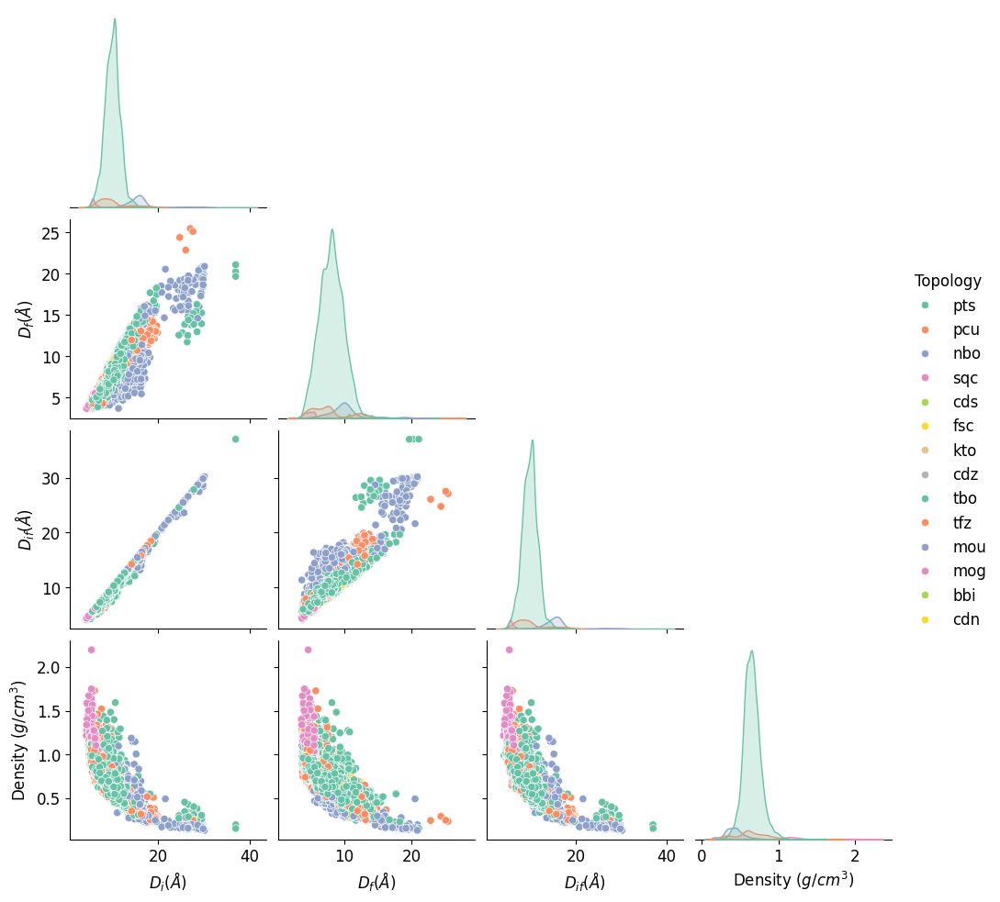

In [92]:
plt.rcParams['font.size'] = 12
plt.rcParams['figure.figsize'] = (10, 10)
sns.pairplot(pair_df, corner=True, hue='Topology', palette='Set2')
#plt.savefig("../../../files/figures_oct23/5-word_distribution_v24.01.24.png", dpi=300)

In [93]:
topo = np.unique(df['Crystalnet'].values)

In [94]:
desc_di_names = ['Di_%s' %i for i in range(10)]
di_di_matrix = [
    [1 - arc_model.wv.distance(w1=i, w2=j) for j in desc_di_names] for i in desc_di_names
]

desc_rho_names = ['info.density_%s' %i for i in range(10)]
rho_rho_matrix = [
    [1 - arc_model.wv.distance(w1=i, w2=j) for j in desc_rho_names] for i in desc_rho_names
]

topo_topo_matrix = [
    [1 - arc_model.wv.distance(w1=i, w2=j) for j in topo] for i in topo
]

In [95]:
di_rho_matrix = [
    [1 - arc_model.wv.distance(w1=i, w2=j) for j in desc_rho_names] for i in desc_di_names
]

di_topo_matrix = [
    [1 - arc_model.wv.distance(w1=i, w2=j) for j in topo] for i in desc_di_names
]

rho_topo_matrix = [
    [1 - arc_model.wv.distance(w1=i, w2=j) for j in topo] for i in desc_rho_names
]

In [96]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from mpl_toolkits.axes_grid1 import make_axes_locatable

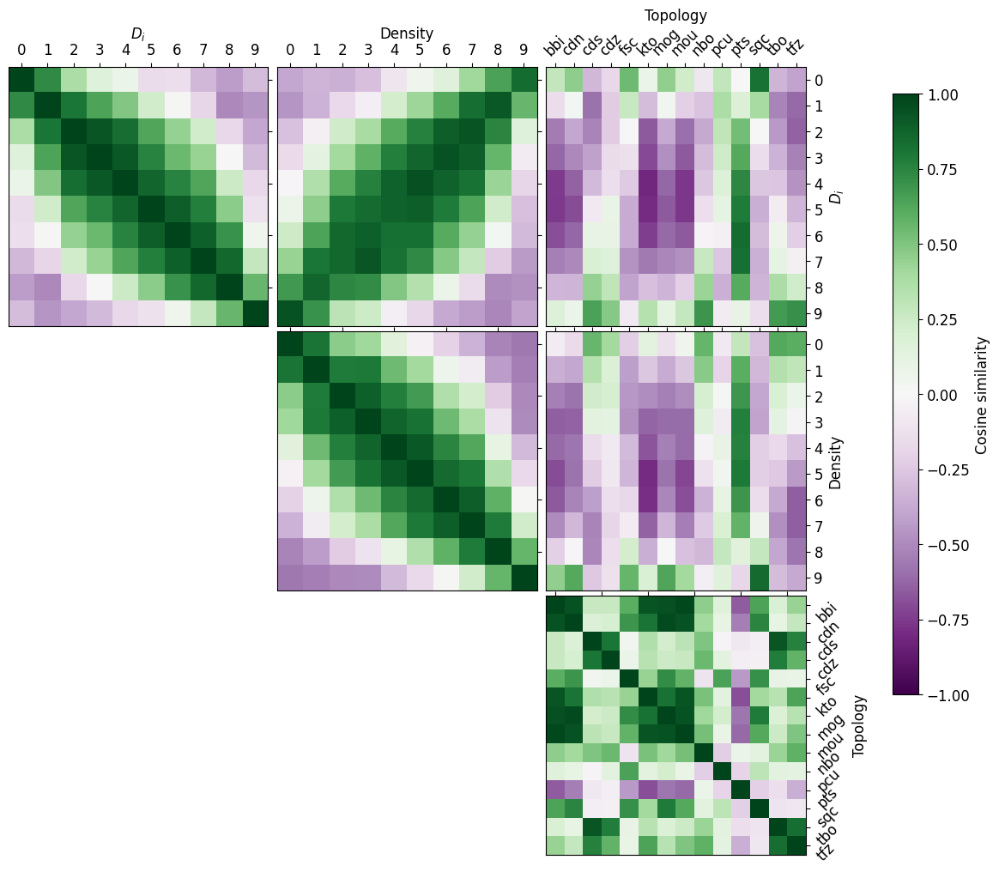

In [97]:
fig, ax = plt.subplots(3, 3)
plt.rcParams['figure.figsize'] = (10, 10)
plt.rcParams['font.size'] = 12

for axx in ax:
    for axy in axx:
        axy.tick_params(top=True, labeltop=True, bottom=False, labelbottom=False, right=True, left=False, labelright=True, labelleft=False)
        axy.xaxis.set_label_position('top')
        axy.yaxis.set_label_position('right')

# ax[0, 0].set_xticks(range(len(desc_di_names)), labels=desc_di_names, rotation=45)
ax[0, 0].set_xlabel('$D_i$')
ax[0, 0].set_xticks(range(len(desc_di_names)), labels=range(len(desc_di_names)))
pcm = ax[0, 0].imshow(di_di_matrix, cmap='PRGn', interpolation='nearest', vmin=-1, vmax=1)
ax[0, 0].yaxis.set_tick_params(labelright=False)

# ax[1, 1].set_xticks(range(len(desc_rho_names)), labels=desc_rho_names, rotation=45)
# ax[1, 1].set_yticks(range(len(desc_rho_names)), labels=desc_rho_names)
ax[1, 1].imshow(rho_rho_matrix, cmap='PRGn', interpolation='nearest', vmin=-1, vmax=1)
ax[1, 1].xaxis.set_tick_params(labeltop=False)
ax[1, 1].yaxis.set_tick_params(labelleft=False, labelright=False)

ax[2, 2].set_ylabel('Topology')
# ax[2, 2].set_xticks(range(len(topo)), labels=topo, rotation=45)
ax[2, 2].set_yticks(range(len(topo)), labels=topo, rotation=45)
ax[2, 2].imshow(topo_topo_matrix, cmap='PRGn', interpolation='nearest', vmin=-1, vmax=1)
ax[2, 2].xaxis.set_tick_params(labeltop=False)
# ax[2, 2].yaxis.set_tick_params(labelright=False)

# ax[0, 1].set_yticks(range(len(desc_di_names)), labels=desc_di_names, rotation=45)
ax[0, 1].set_xticks(range(len(desc_rho_names)), labels=range(len(desc_rho_names)))
ax[0, 1].imshow(di_rho_matrix, cmap='PRGn', interpolation='nearest', vmin=-1, vmax=1)
ax[0, 1].set_xlabel('Density')
ax[0, 1].yaxis.set_tick_params(labelright=False)

ax[0, 2].set_yticks(range(len(desc_di_names)), labels=range(len(desc_di_names)))
ax[0, 2].set_xticks(range(len(topo)), labels=topo, rotation=45)
ax[0, 2].imshow(di_topo_matrix, cmap='PRGn', interpolation='nearest', aspect=1.4, vmin=-1, vmax=1)
ax[0, 2].set_xlabel('Topology')
ax[0, 2].set_ylabel('$D_i$')
# ax[0, 2].yaxis.set_tick_params(labelright=False)

ax[1, 2].set_yticks(range(len(desc_rho_names)), labels=range(len(desc_rho_names)))
ax[1, 2].set_xticks(range(len(topo)), labels=topo, rotation=45)
ax[1, 2].imshow(rho_topo_matrix, cmap='PRGn', interpolation='nearest', aspect=1.4, vmin=-1, vmax=1)
ax[1, 2].set_ylabel('Density')
ax[1, 2].xaxis.set_tick_params(labeltop=False)
# ax[1, 2].yaxis.set_tick_params(labelright=False)

ax[1, 0].set_axis_off()
ax[2, 0].set_axis_off()
ax[2, 1].set_axis_off()


fig.subplots_adjust(right=0.9)
plt.tight_layout(pad=0, w_pad=0, h_pad=0)
cbar_ax = fig.add_axes([1.03, 0.2, 0.03, 0.7])
fig.colorbar(pcm, cax=cbar_ax, label='Cosine similarity')

# fig.colorbar(pcm, ax=ax[1:, 0], location='left', label='Cosine similarity', shrink=1)
# plt.savefig("../../../files/figures_oct23/5-heatmap_v24.01.24.png", dpi=300)

# SI

## p-value

In [98]:
def pvalue(mofs, model):
    reference = mofs
    similar_matrix = []
    for i in reference:
        row = []
        for j in reference:
            vec_i = model.dv[i]
            vec_j = model.dv[j]
            row.append(
                cosine(vec_i, vec_j)
            )
        similar_matrix.append(row)
    thresholds = np.arange(-1, 1.05, 0.05)
    p_val = []
    n_reference = len(reference)
    for th in thresholds:
        p = sum(sum(np.array(similar_matrix) >= th)) / (n_reference**2)
        p_val.append(p)
        
    return p_val

In [99]:
ch4_pvalues = []
for ref_mof in [ch4_mof1, ch4_mof2, ch4_mof3, ch4_mof4]:
    pval = pvalue(ref_mof, arc_model)
    ch4_pvalues.append(pval)

In [100]:
co2_pvalues = []
for ref_mof in [co2_mof1, co2_mof2, co2_mof3, co2_mof4]:
    pval = pvalue(ref_mof, arc_model)
    co2_pvalues.append(pval)

In [101]:
qmof_pvalues = []
for ref_mof in [qmof1, qmof2, qmof3, qmof4]:
    pval = pvalue(ref_mof, qmof_model)
    qmof_pvalues.append(pval)

In [102]:
thresholds = np.arange(-1, 1.05, 0.05)

If such threshold values are generally applicable in the context of similarity searching, i.e., if a similarity value exceeding a threshold value is a rare event and thus indicates significant similarity, they must be largely independent of the selected reference compound.

/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_43170/1246387184.py:27: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(ax=ax1[0], a=dist, hist=False, color=density_colors[i], kde_kws=dict(linewidth=2), bins=np.arange(-1, 1.1, 0.1))
/var/folders/gt/tsyp2wjd1ng0pkr1tf52kn600000gn/T/ipykernel_43170/1246387184.py:27: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions,

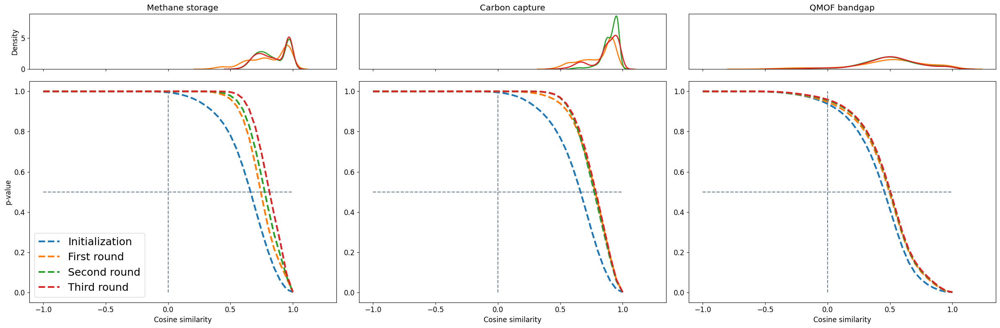

In [103]:
plt.rcParams["figure.figsize"] = (24,8)
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=3, sharex=True, gridspec_kw={'height_ratios': [1, 4]})

ax1[0].set_title("Methane storage")
ax1[1].set_title("Carbon capture")
ax1[2].set_title("QMOF bandgap")

for i in ch4_pvalues:
    ax2[0].plot(thresholds, i, linewidth=3, linestyle='--')

for j in co2_pvalues:
    ax2[1].plot(thresholds, j, linewidth=3, linestyle='--')
    
for q in qmof_pvalues:
    ax2[2].plot(thresholds, q, linewidth=3, linestyle='--')

for ax in ax2:
    ax.plot([-1, 1], [0.5, 0.5], '--', c='slategrey')
    ax.plot([0,0], [0,1], '--', c='slategrey')
    ax.set_xlabel("Cosine similarity")

ax2[0].set_ylabel("p-value")

density_colors = ['#ff7f0e', '#2ca02c', '#d62728']

for i, dist in enumerate([ch4_cos1, ch4_cos2, ch4_cos3]):
    sns.distplot(ax=ax1[0], a=dist, hist=False, color=density_colors[i], kde_kws=dict(linewidth=2), bins=np.arange(-1, 1.1, 0.1))

for i, dist in enumerate([co2_cos1, co2_cos2, co2_cos3]):
    sns.distplot(ax=ax1[1], a=dist, hist=False, color=density_colors[i], kde_kws=dict(linewidth=2), bins=np.arange(-1, 1.1, 0.1))
    
for i, dist in enumerate([qmof_cos1, qmof_cos2, qmof_cos3]):
    sns.distplot(ax=ax1[2], a=dist, hist=False, color=density_colors[i], kde_kws=dict(linewidth=2), bins=np.arange(-1, 1.1, 0.1))
    
for ax in ax1:
    # ax.yaxis.set_visible(False)
    ax.set_ylim([0, 8.9])
    
for ax in ax1[1:]:
    ax.yaxis.set_visible(False)

    
ini_mk = mlines.Line2D([], [], label='Initialization', linestyle='--', linewidth=3, color='#1f77b4')
first_mk = mlines.Line2D([], [], label='First round', linestyle='--', linewidth=3, color=density_colors[0])
second_mk = mlines.Line2D([], [], label='Second round', linestyle='--', linewidth=3, color=density_colors[1])
third_mk = mlines.Line2D([], [], label='Third round', linestyle='--', linewidth=3, color=density_colors[2])


ax2[0].legend(handles=[ini_mk, first_mk, second_mk, third_mk], loc ="lower left", fontsize=18)
        
plt.subplots_adjust(hspace=0)
plt.tight_layout()

In [105]:
func = [
    'N_C_H_H', 'N_C_O_O', 
    'O_C_H', 
    'F_C', 'Cl_C', 'Br_C', 'I_C',
    'C_H_H_H_O', 'C_C_H_H_H',
    'H_C',
    'C_C_F_F_F'
]
func_vec =  [arc_model.wv[fu] for fu in func] 
func_matrix = [
    [1 - arc_model.wv.distance(w1=i, w2=j) for j in func] for i in func
]

In [106]:
func_name = [
    '$-NH_2$', '$-NO_2$',
    '-OH', 
    '-F', '-Cl', '-Br', '-I',
    '$-O-CH_3$', '$-CH_3$',
    '-H',
    '$-CF_3$'
]

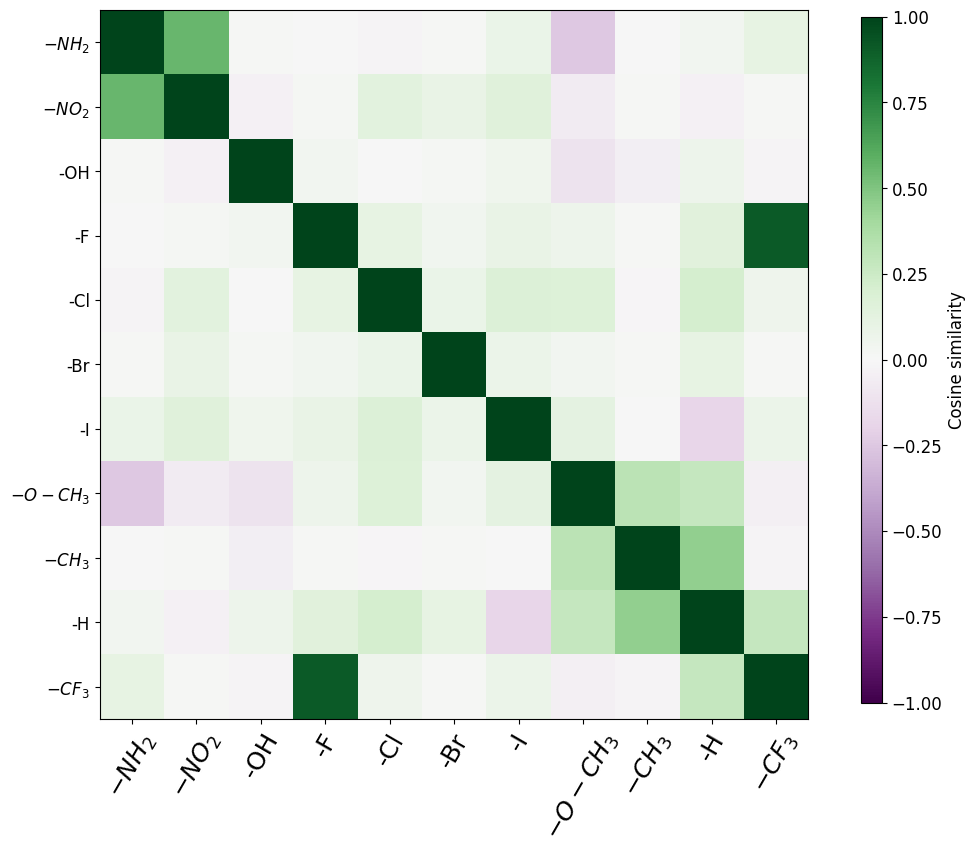

<Figure size 1050x980 with 0 Axes>

In [107]:
plt.rcParams["figure.figsize"] = (10.5,9.8)
fig, ax = plt.subplots(nrows=1, ncols=1)

im = ax.imshow(func_matrix, vmin=-1, vmax=1, cmap='PRGn')

ax.set_xticks(range(len(func)), labels=func_name, rotation=60, fontsize=18)
ax.set_yticks(range(len(func)), labels=func_name)

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.15, 0.02, 0.7])
fig.colorbar(im, cax=cbar_ax, shrink=0.1, pad=0.02, label='Cosine similarity')

    
plt.show()
plt.tight_layout()